# Algorithms

## Imports and Preprocessing

In [1]:
import pandas as pd

import Reader
import LogKeysManager
import ParamsExtractor
import DataPreprocessor
import ReduceDim
import ClusterData
import OneClass

/home/rocky/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Testing Params Extractor
#log_types = ['cron', 'user']
log_types = ['cron', 'laurel', 'maillog', 'messages', 'secure', 'user']
file_paths = ['../../../temp_logs/login01.' + logtype + '.log' for logtype in log_types]

df_list = []

for file_path in file_paths:
    r = Reader.Reader(file_path)
    df = r.read_file()
    df_list.append(df)

In [3]:
df_after = []

for i, df in enumerate(df_list):
    p = ParamsExtractor.ParamsExtractor(df)
    df = p.convert_params(df)
    new_df = p.get_params()
    df_after.append(new_df)

for i in range(len(df_list)):
    #print('=================')
    #print(df_list[i].head())
    #print(df_list[i].columns)
    #print(df_list[i].iloc[0])
    #print('********')
    #print(df_after[i].head())
    #print(df_after[i].columns)
    #print(df_after[i].iloc[0])
    
    # Concatenate df and df_after
    df_list[i] = pd.concat([df_list[i], df_after[i]], axis=1)
    #print(df_list[i].columns)

In [4]:
# Data Preprcessor

for i, df in enumerate(df_list):
    d = DataPreprocessor.DataPreprocessor(df)
    enc = d.drop_and_one_hot_encode()
    df_list[i] = enc

## ML

### Decompositions and clustering

#### scatterplots

cron


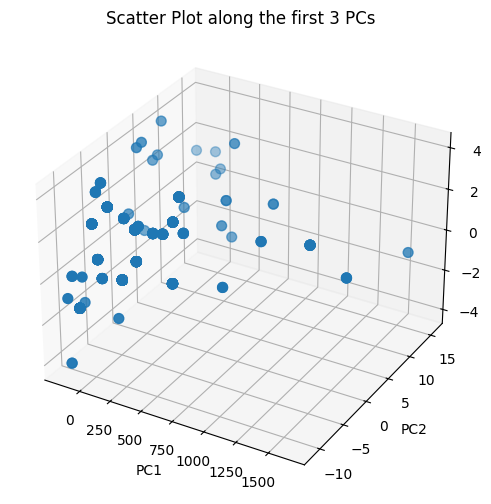

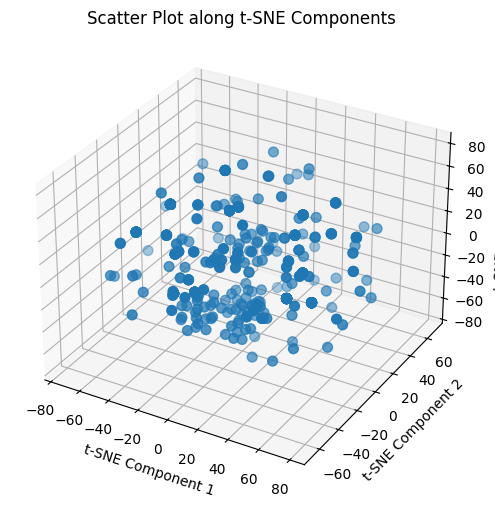

/home/rocky/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


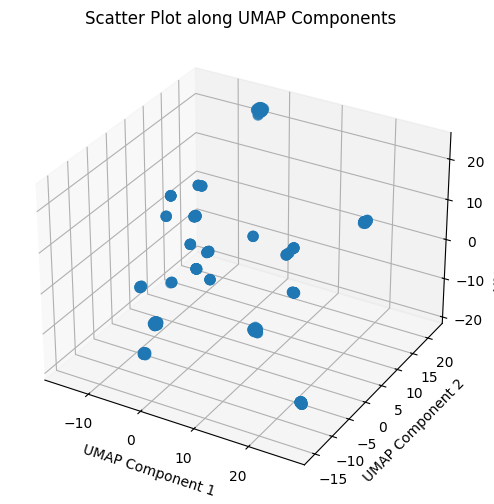

laurel


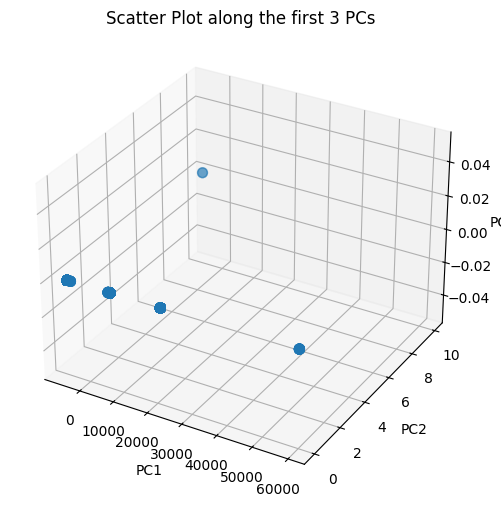

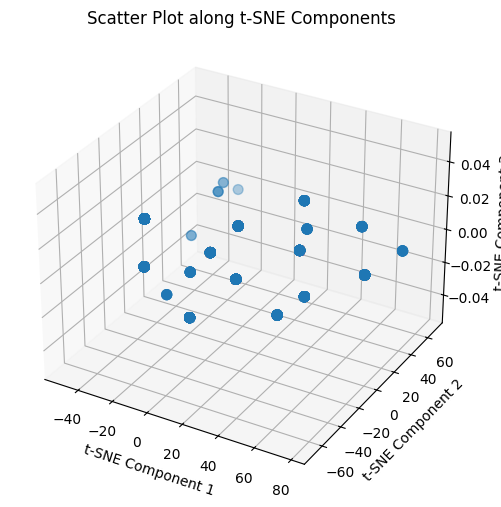

/home/rocky/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/rocky/.local/lib/python3.9/site-packages/umap/spectral.py:550: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


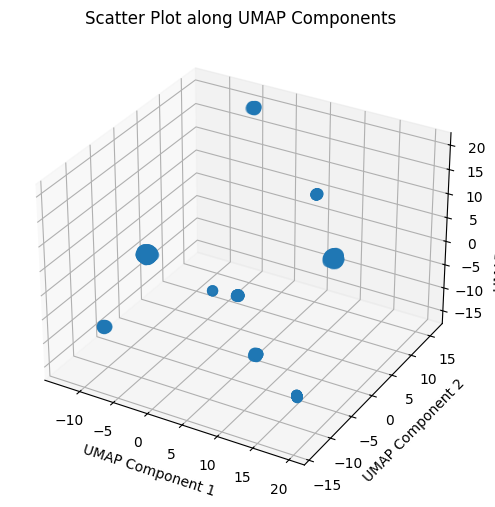

maillog


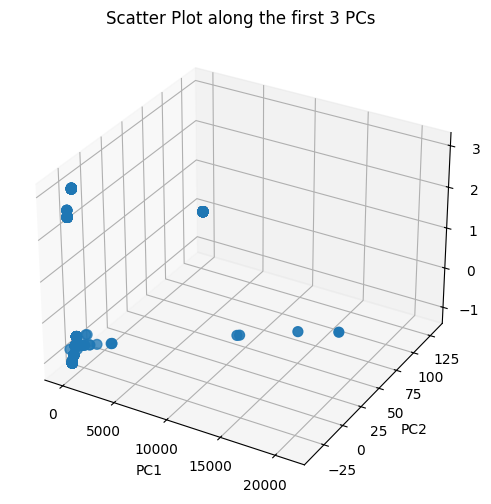

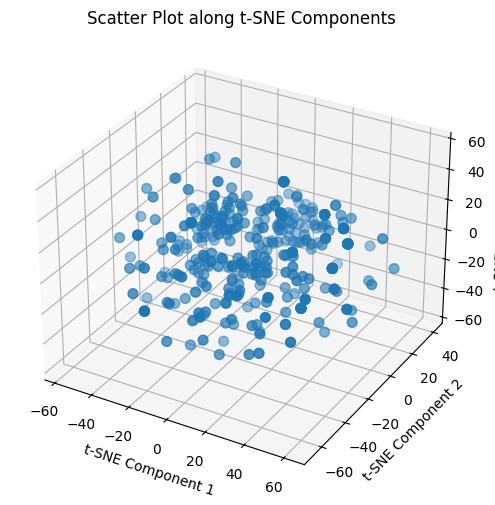

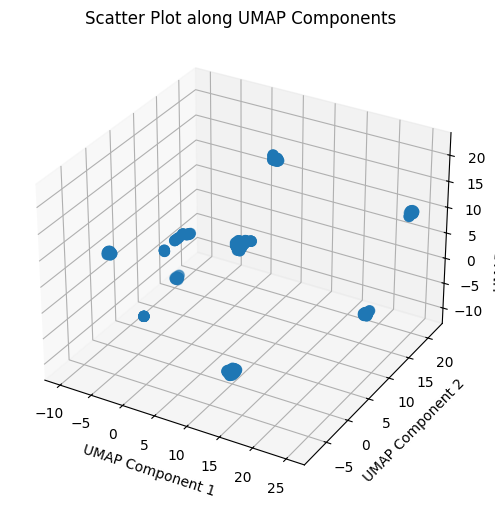

messages


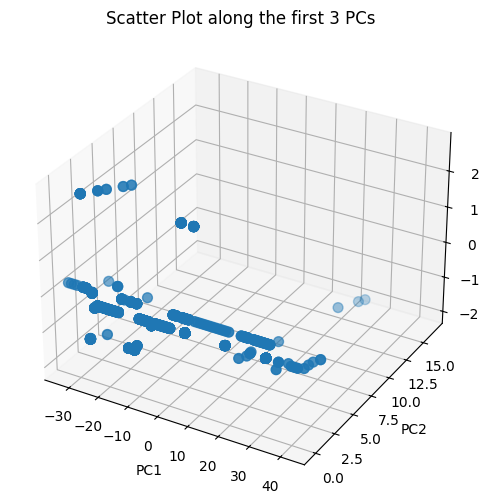

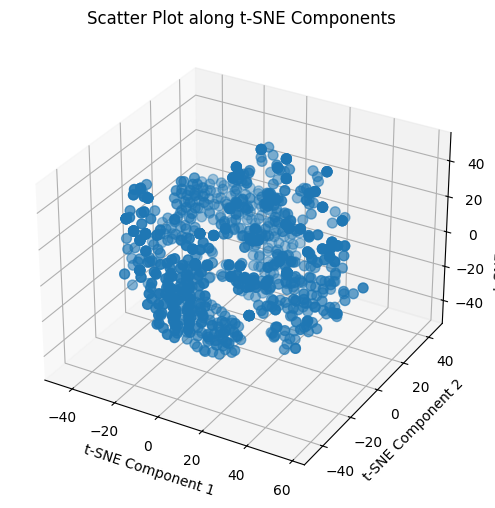

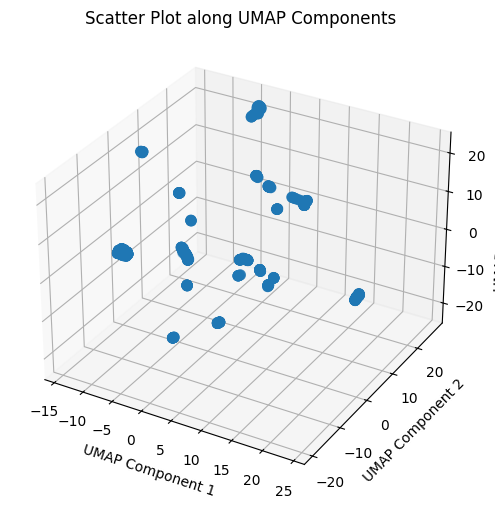

secure


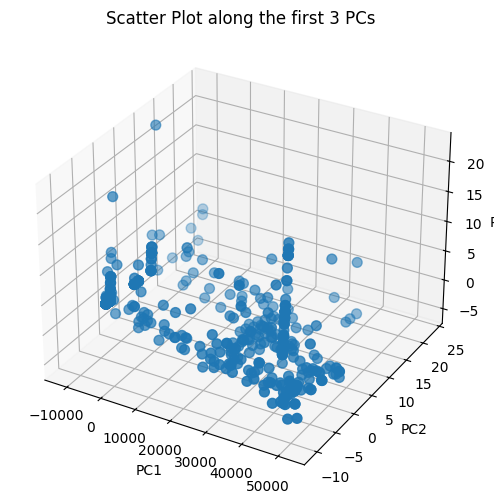

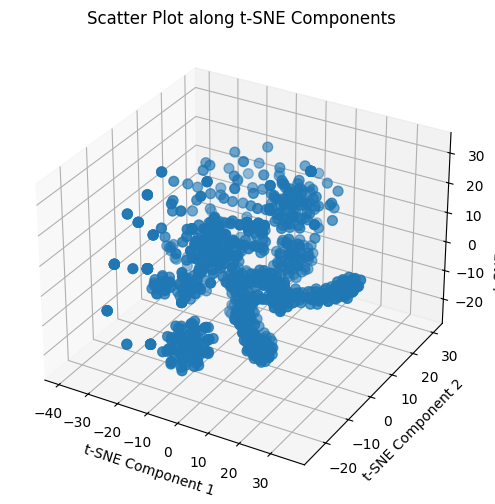

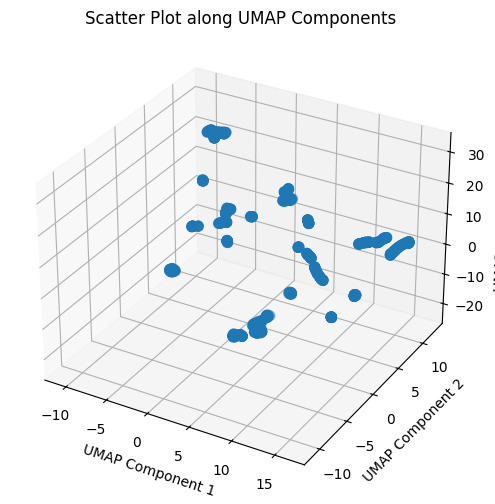

user


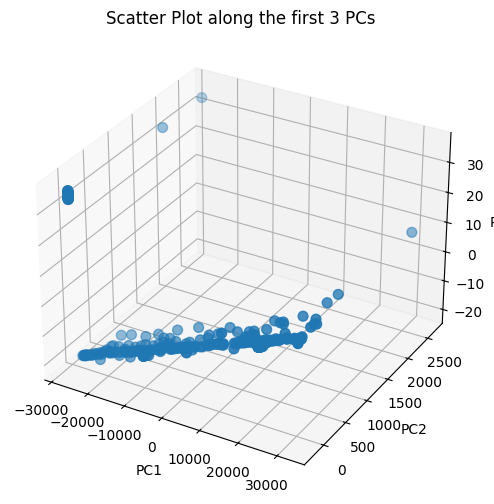

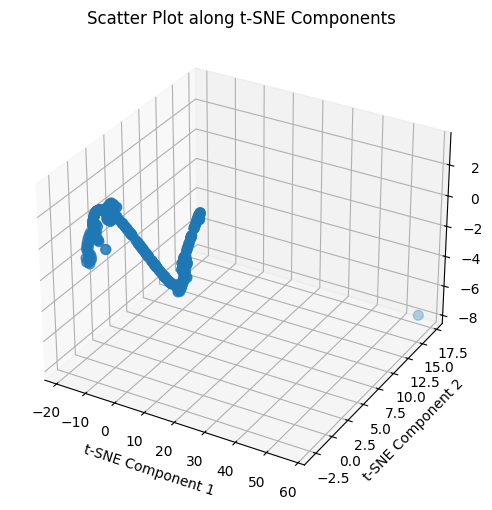

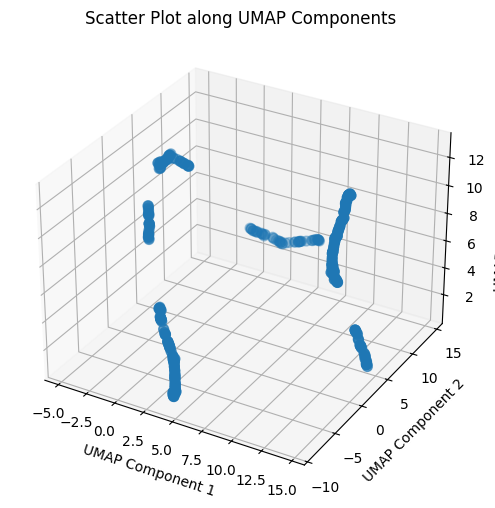

In [5]:
pcas = []
tsnes = []
umaps = []
for i in range(len(df_list)):
    print(log_types[i])
    r = ReduceDim.ReduceDim(3, df_list[i], [1,0])
    pca_reduced_data = r.pca()
    tsne_reduced_data = r.tsne()
    umap_reduced_data = r.umap()
    pcas.append(pca_reduced_data)
    tsnes.append(tsne_reduced_data)
    umaps.append(umap_reduced_data)

#### pca + dbscan

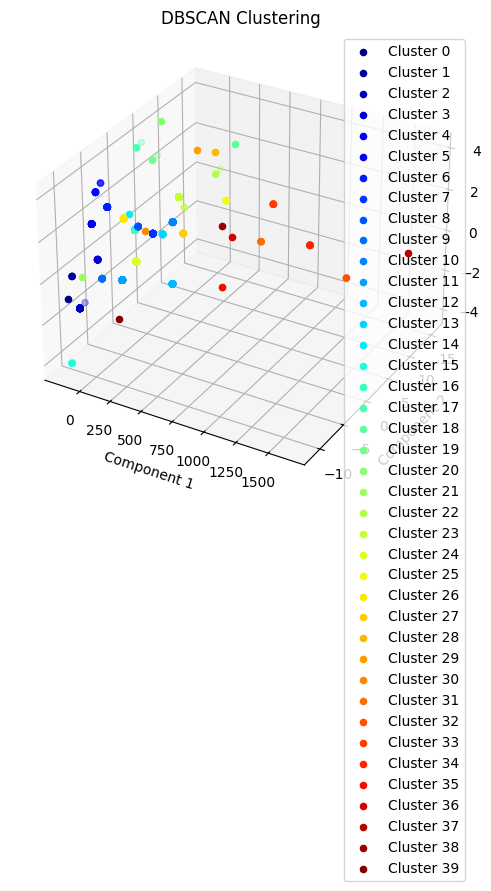

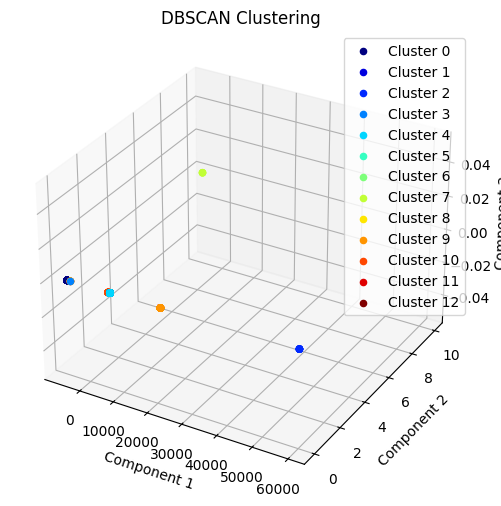

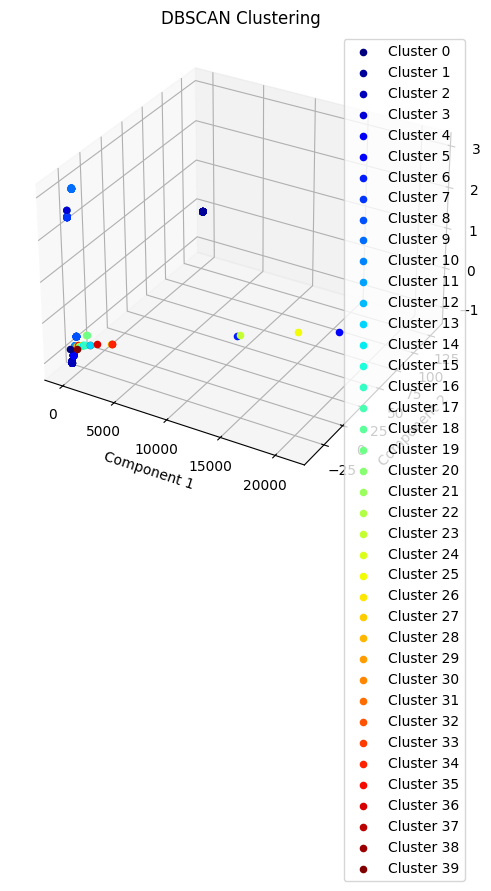

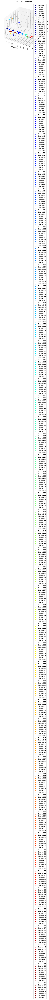

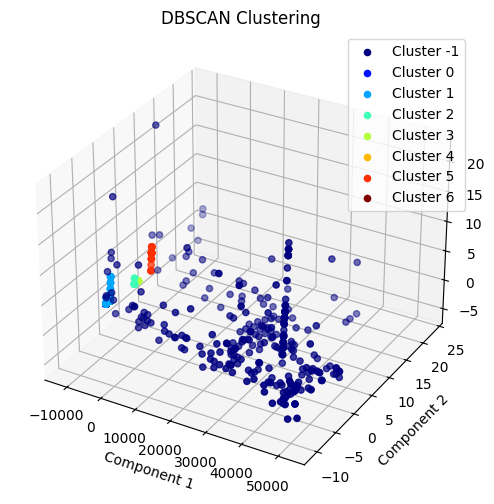

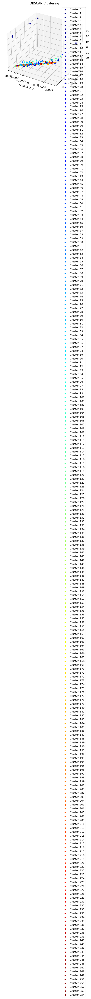

In [6]:
for pca_reduced_data in pcas:
    c = ClusterData.ClusterData(pca_reduced_data, [1,0])
    dbscan_clustered_data = c.dbscan()

#### tsne + dbsccan

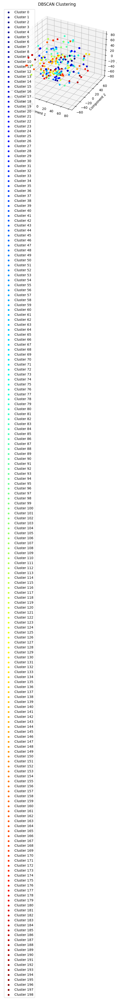

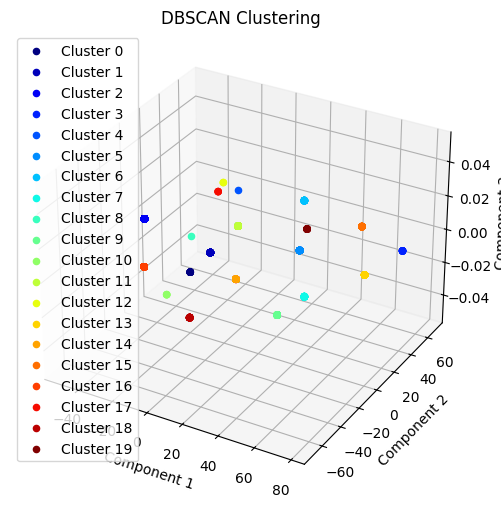

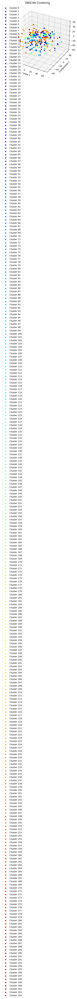

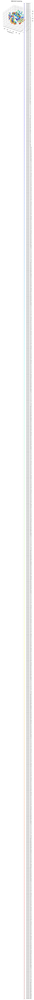

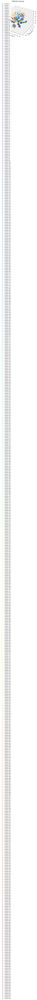

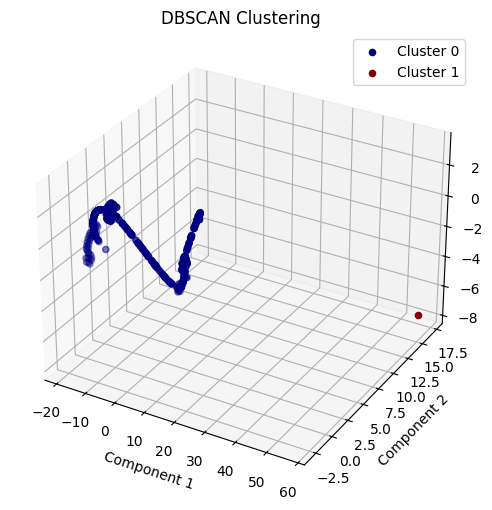

In [7]:
for tsne_reduced_data in tsnes:
    c = ClusterData.ClusterData(tsne_reduced_data, [1,0])
    dbscan_clustered_data = c.dbscan()

#### umap + dbscan

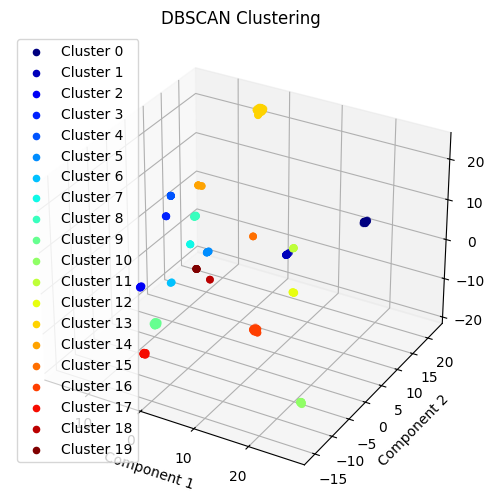

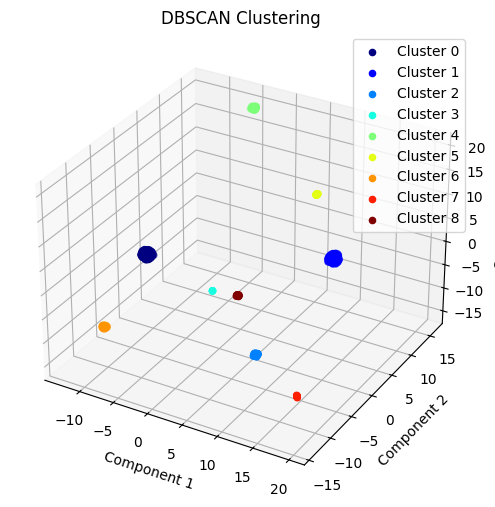

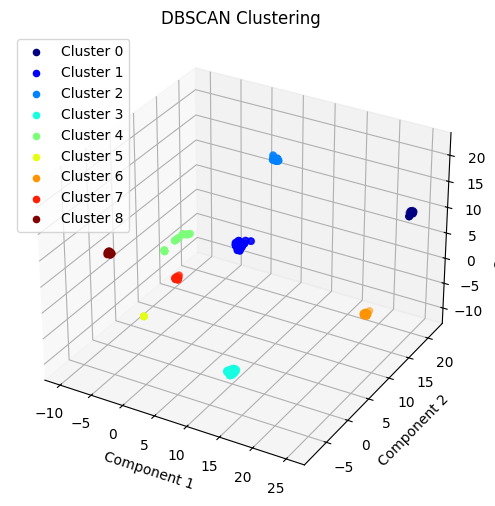

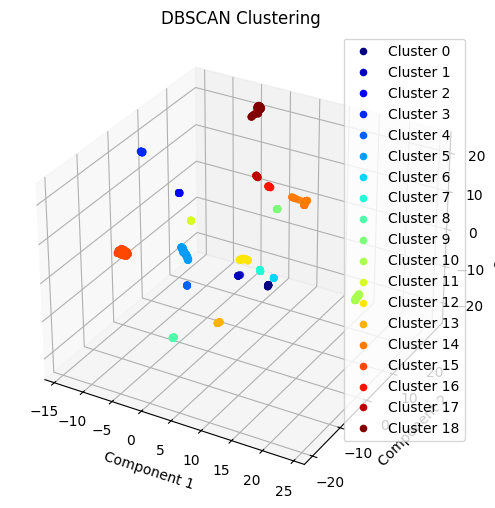

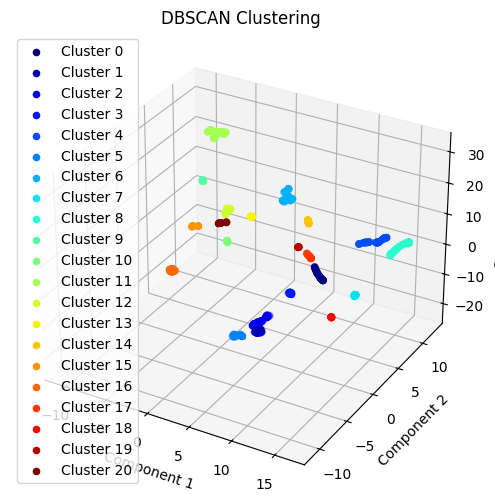

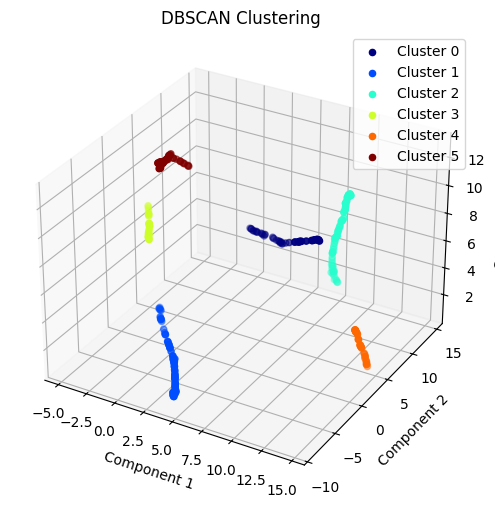

In [8]:
for umap_reduced_data in umaps:
    c = ClusterData.ClusterData(umap_reduced_data, [1,0])
    dbscan_clustered_data = c.dbscan()

### Only clustering (dbscan)

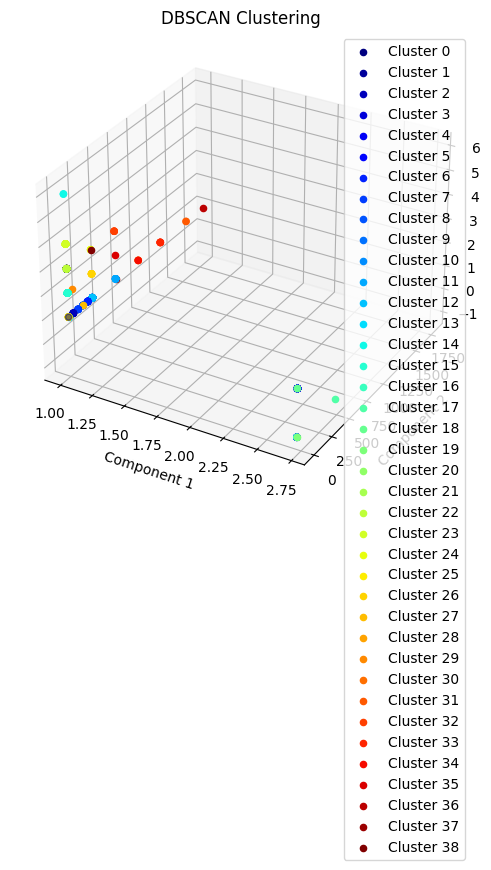

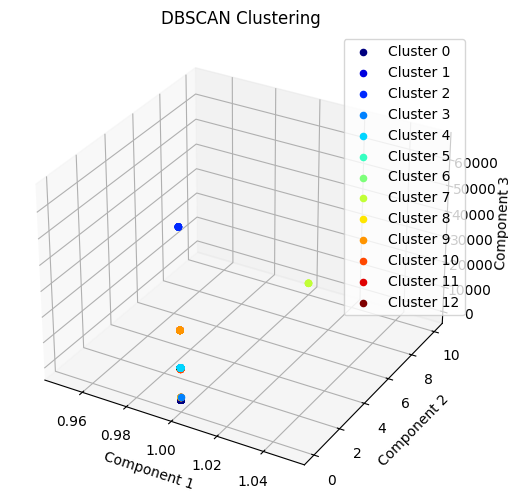

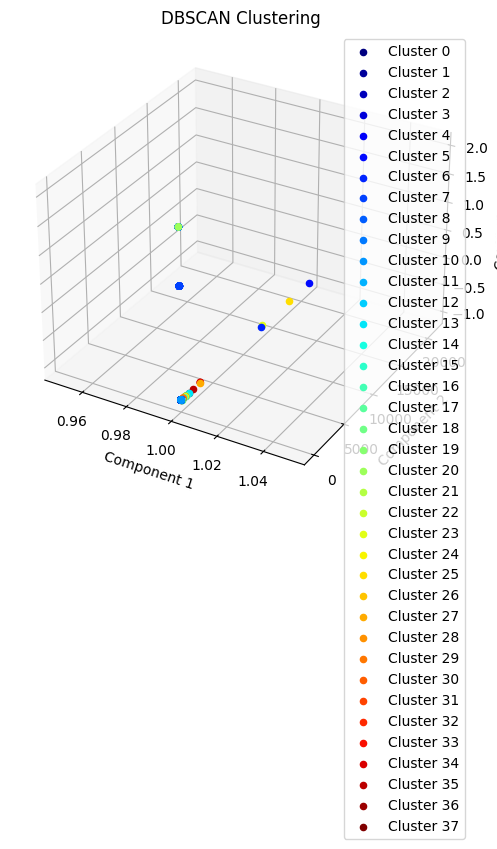

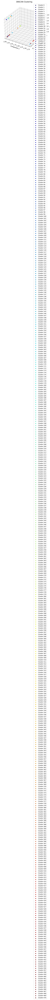

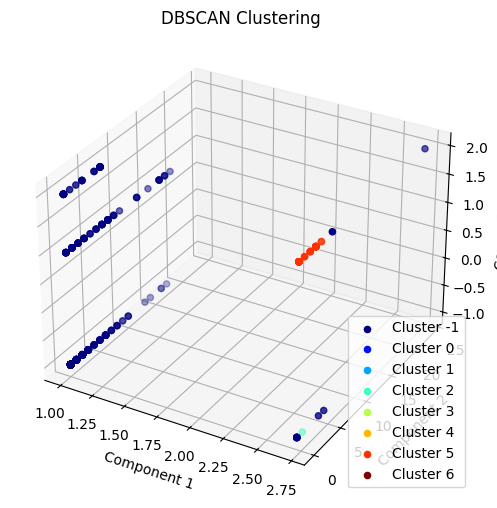

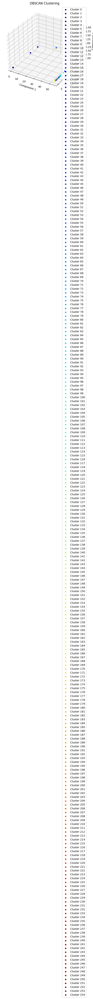

In [15]:
for i in range(len(df_list)):
    data = df_list[i].to_numpy()
    c = ClusterData.ClusterData(data, [1,0])
    dbscan_clustered_data = c.dbscan()

### Decompositions and Anomaly Detection

## DL

### Autoencoder

### LSTM

### Transformers